# Triple Spec Focus Calculator

In [1]:
data_path = '/data/simon/data/soar/tspec_focus/UT20201122'

In [139]:
import os
import glob

file_list = glob.glob(os.path.join(data_path, '*fits'))

In [76]:
from ccdproc import CCDData
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.visualization import SqrtStretch, ZScaleInterval, MinMaxInterval

plt.style.use('dark_background')
def show_files(ccd):
    ccd = CCDData.read(full_path,
                       unit='adu')
#     scale = MinMaxInterval()
    scale = ZScaleInterval()
    z1, z2 = scale.get_limits(ccd.data)
    print(z1, z2)
#     norm = ImageNormalize(stretch=SqrtStretch())
    fig, ax = plt.subplots(figsize=(20,15))
    ax.set_title("{} {}".format(ccd.header['FILENAME'], ccd.header['TELFOCUS']))
    ax.imshow(ccd.data, clim=(z1, z2), cmap=cm.gray, origin='lower',
              interpolation='nearest')
    plt.show()
    
    plt.close()

0 371


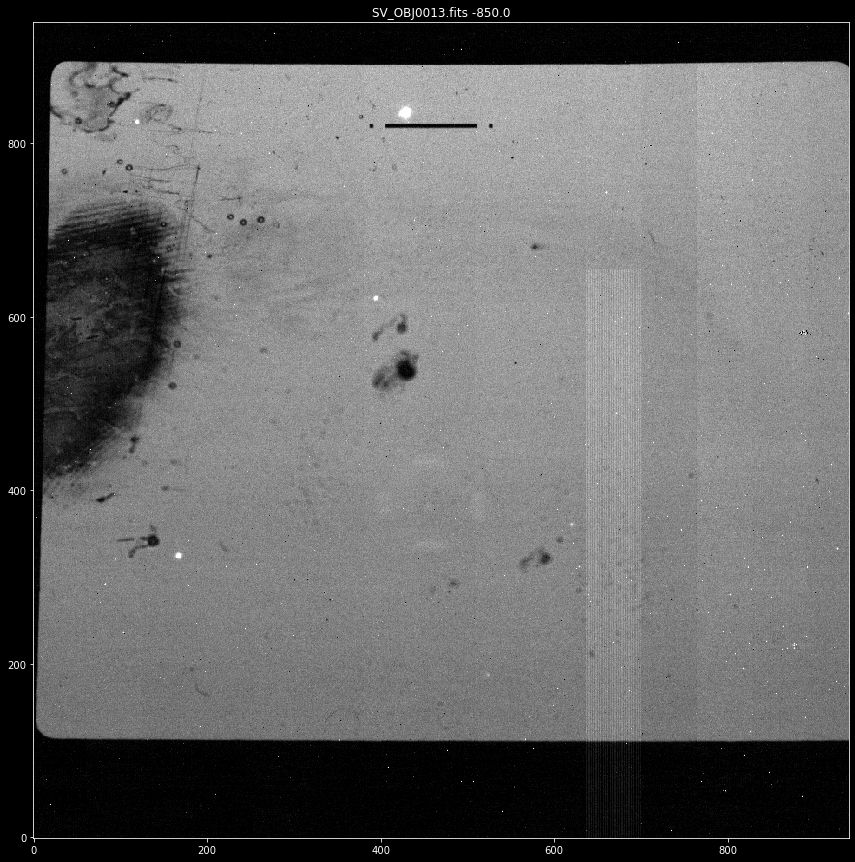

0 371


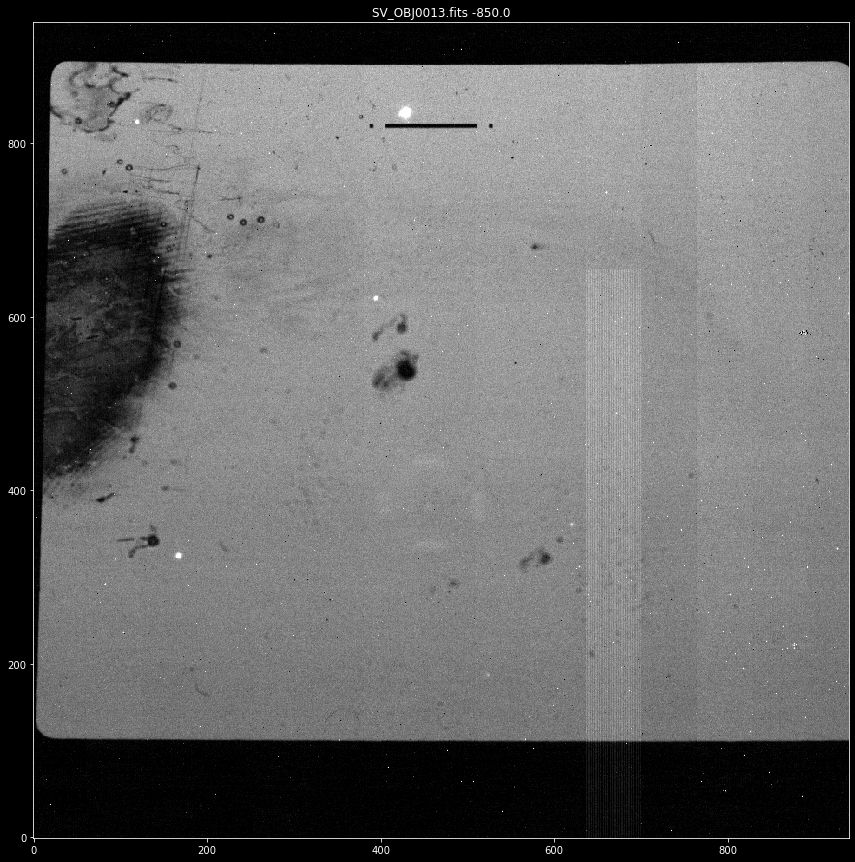

0 371


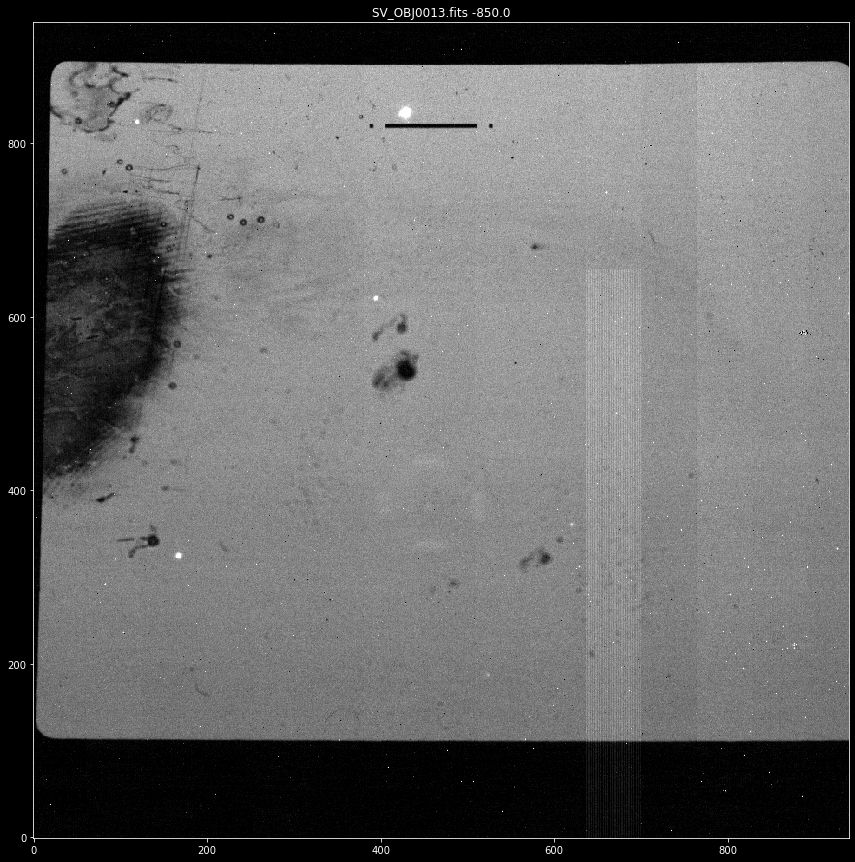

0 371


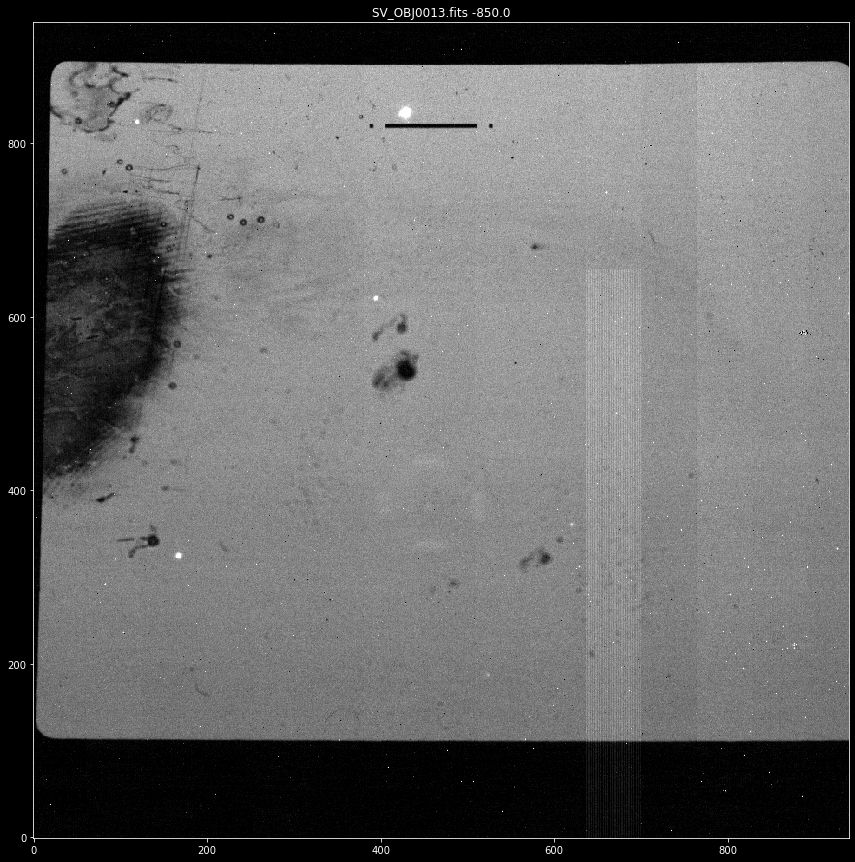

0 371


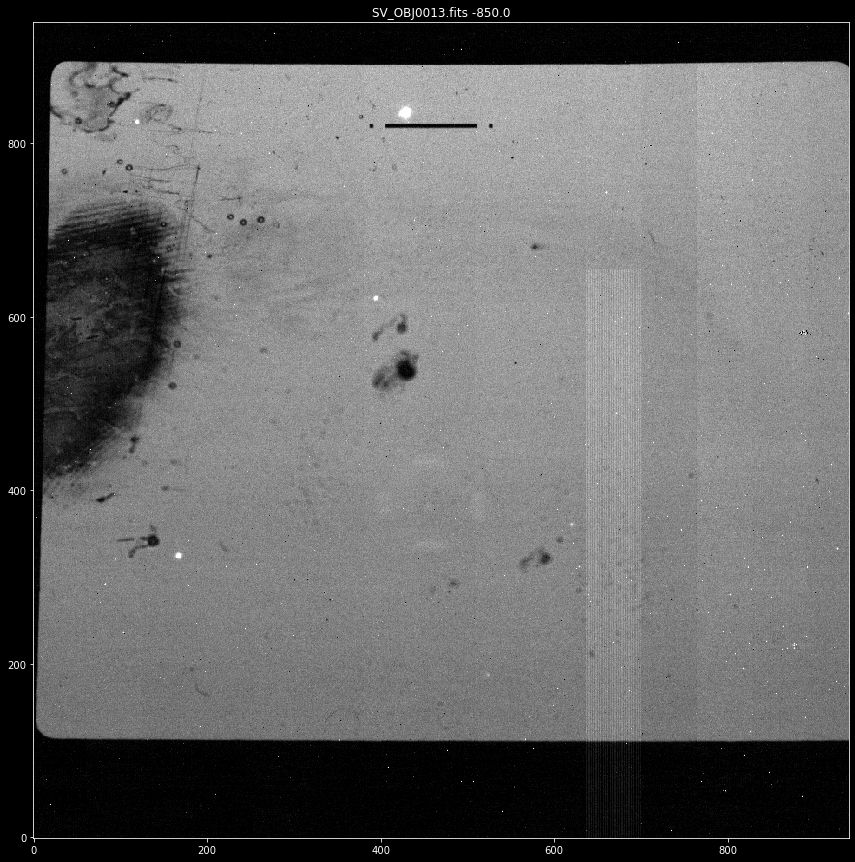

0 371


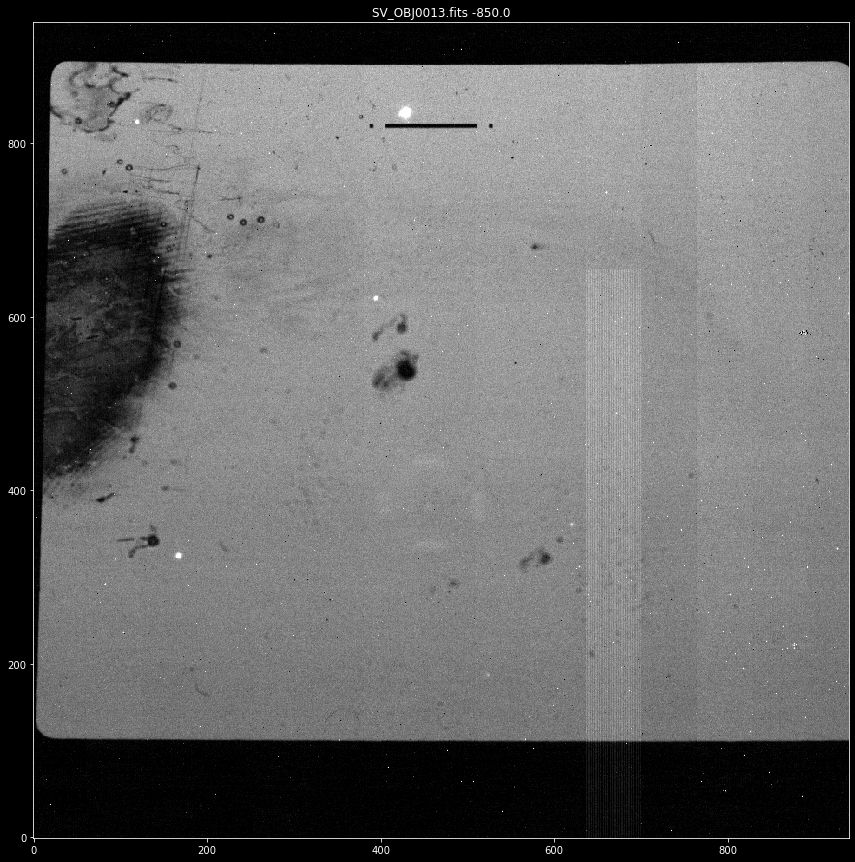

0 371


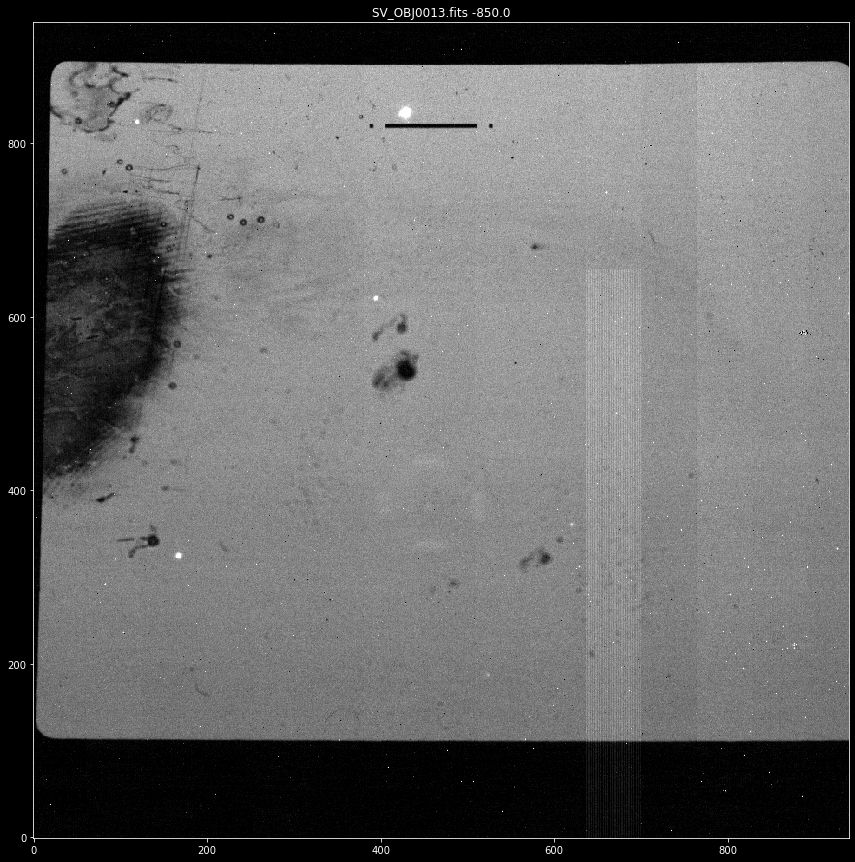

In [140]:
for _file in file_list:
    ccd = CCDData.read(_file, unit='adu')
    show_files(ccd)

In [193]:
from ccdproc import ccdmask
from ccdproc import trim_image
from astropy.stats import sigma_clipped_stats
from photutils import DAOStarFinder
from photutils import CircularAperture
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
import copy
import numpy as np
import glob

/user/simon/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


Processing file: /data/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0010.fits
211.3637778714543 211.0 26.359768378068615


/user/simon/anaconda3/lib/python3.7/site-packages/photutils/detection/findstars.py:984: NoDetectionsWarning: Sources were found, but none pass the sharpness and roundness criteria.
  'and roundness criteria.', NoDetectionsWarning)


Unable to detect sources in file: SV_OBJ0010.fits
Processing file: /data/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0011.fits
209.5115685430611 208.0 28.517881618742468
 id xcentroid ycentroid sharpness   roundness1  roundness2 npix sky peak    flux      mag     focus     filename   
--- --------- --------- ---------- ------------ ---------- ---- --- ---- --------- ---------- ----- ---------------
  1 404.39943 720.88247 0.36326454 -0.027821971 0.49106748  169   0 1776 14.339508 -2.8913356 -1070 SV_OBJ0011.fits
[[404.39942924 720.88246647]]
Processing file: /data/simon/data/soar/tspec_focus/UT20201122/SV_OBJ0012.fits
207.71980762247765 208.0 30.47598237103978
 id xcentroid ycentroid sharpness   roundness1  roundness2  npix sky peak    flux      mag     focus     filename   
--- --------- --------- ---------- ----------- ------------ ---- --- ---- --------- ---------- ----- ---------------
  1 406.11898 720.73619 0.72656557 -0.16036008 -0.085463679  169   0 7950 55.387695 -4.3585332  

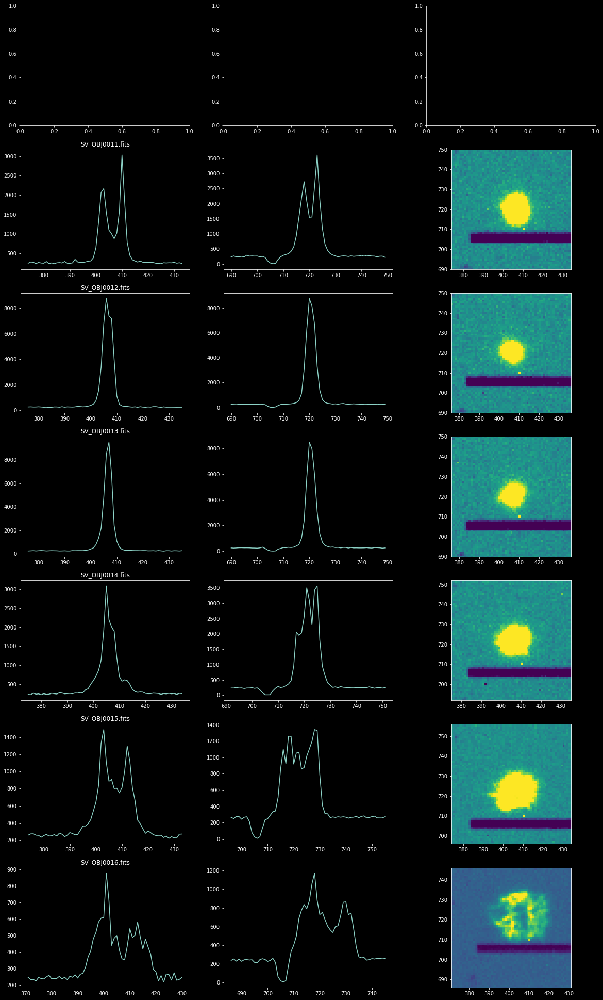

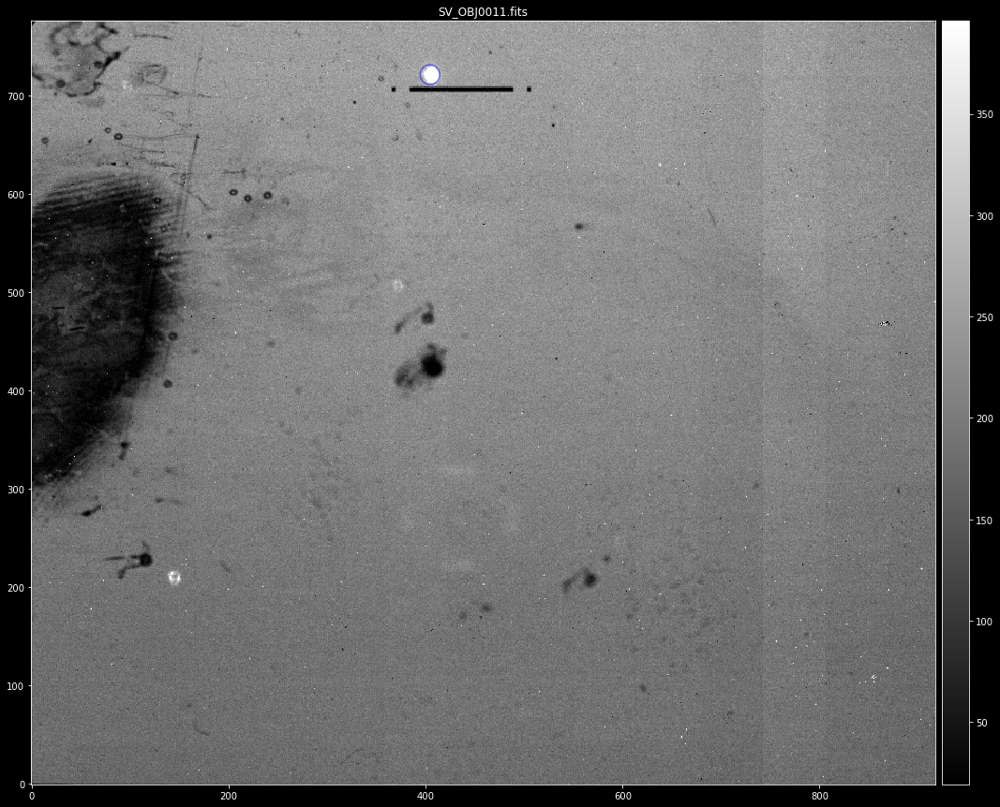

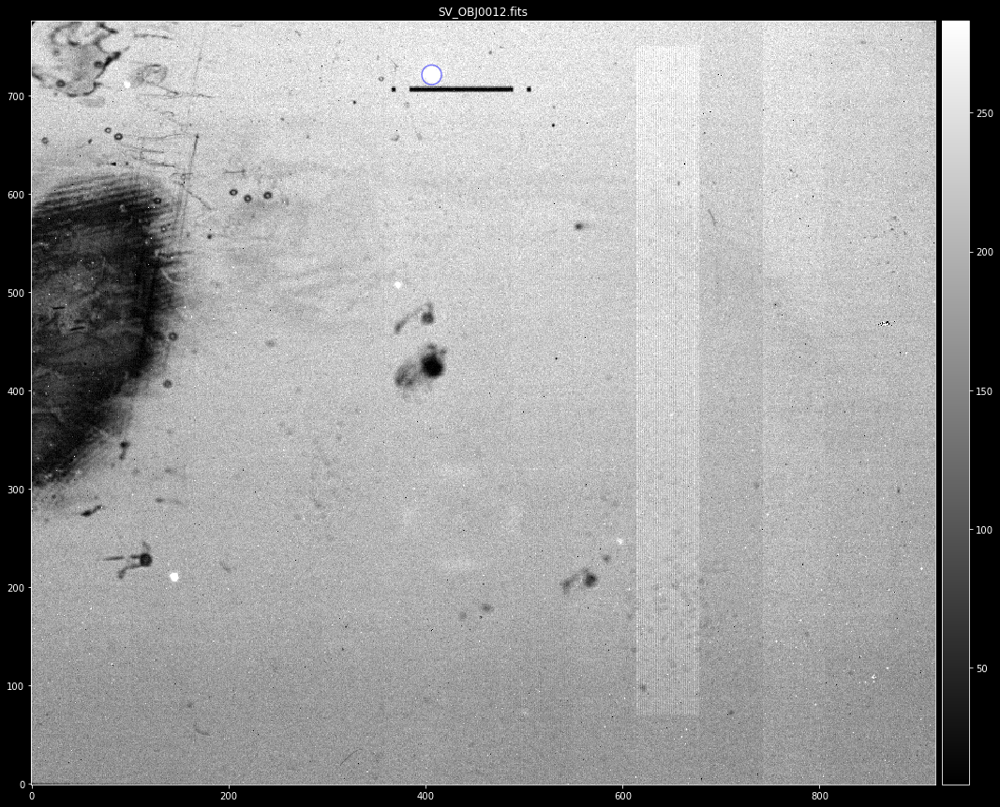

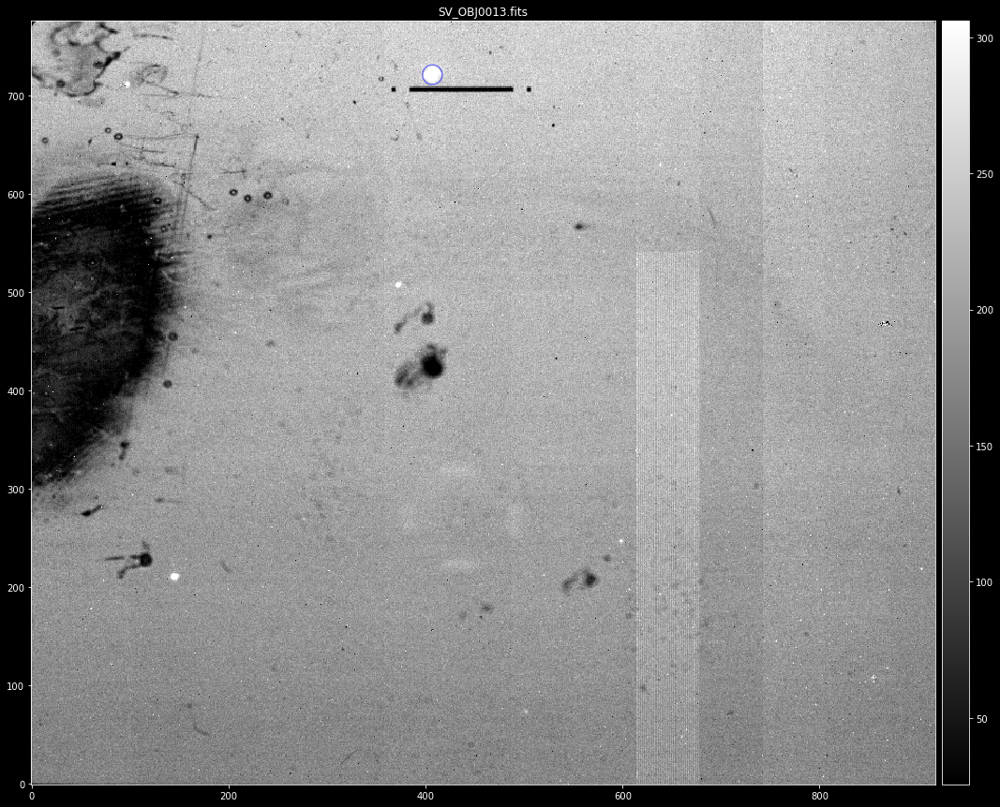

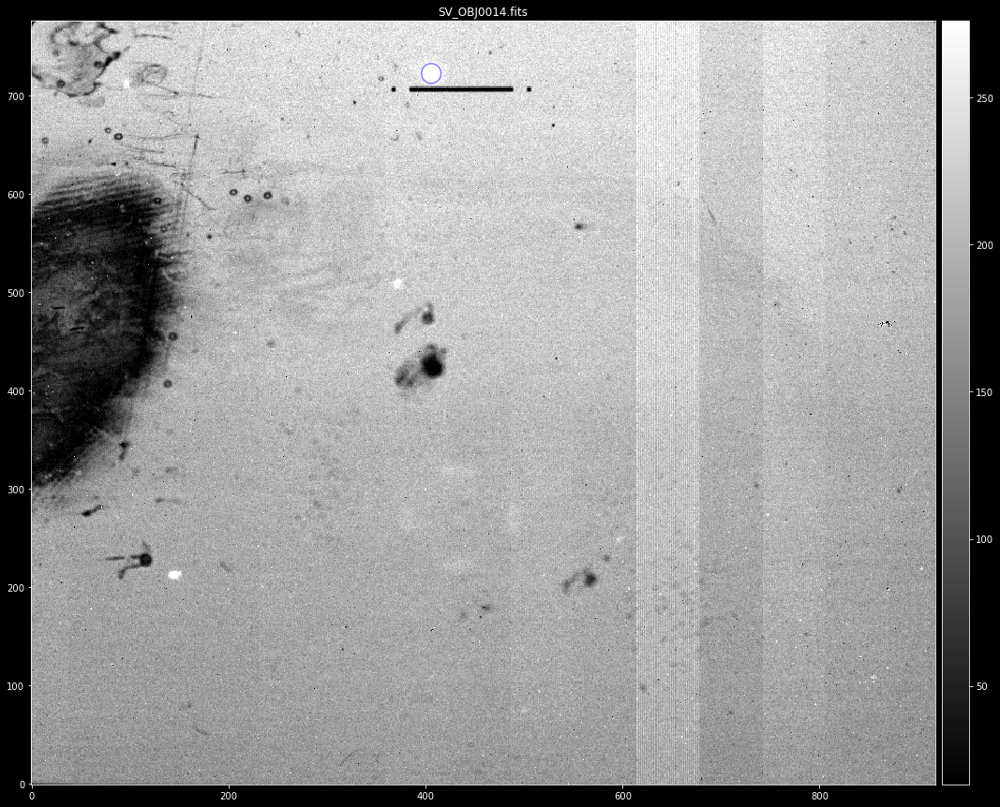

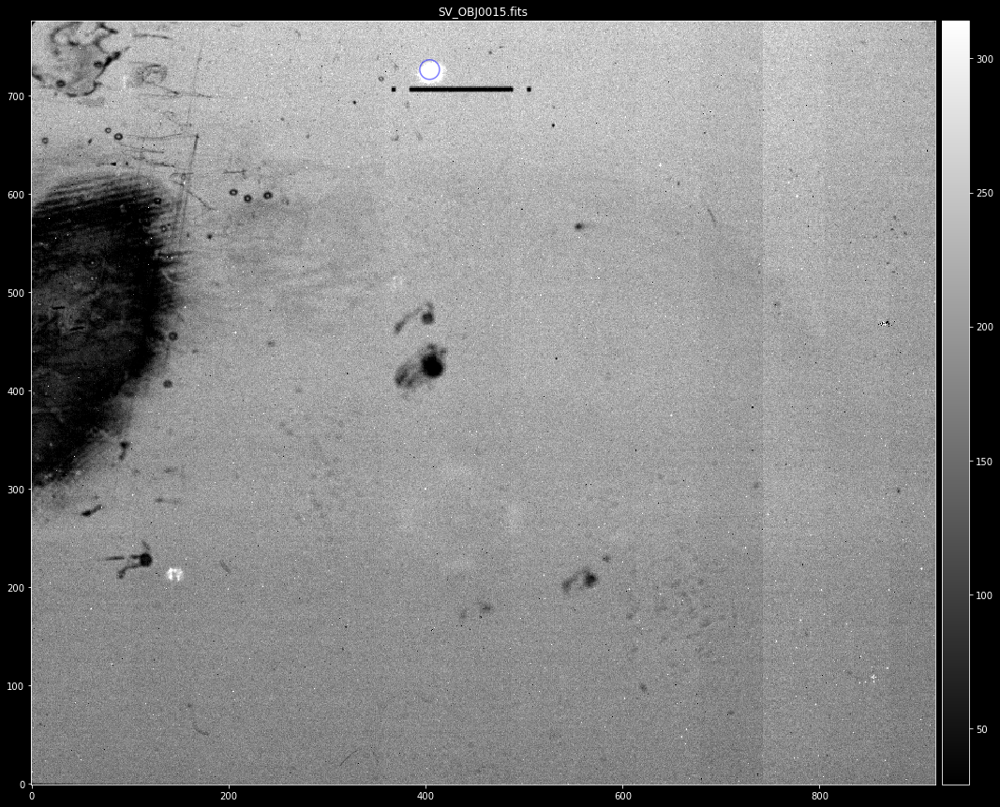

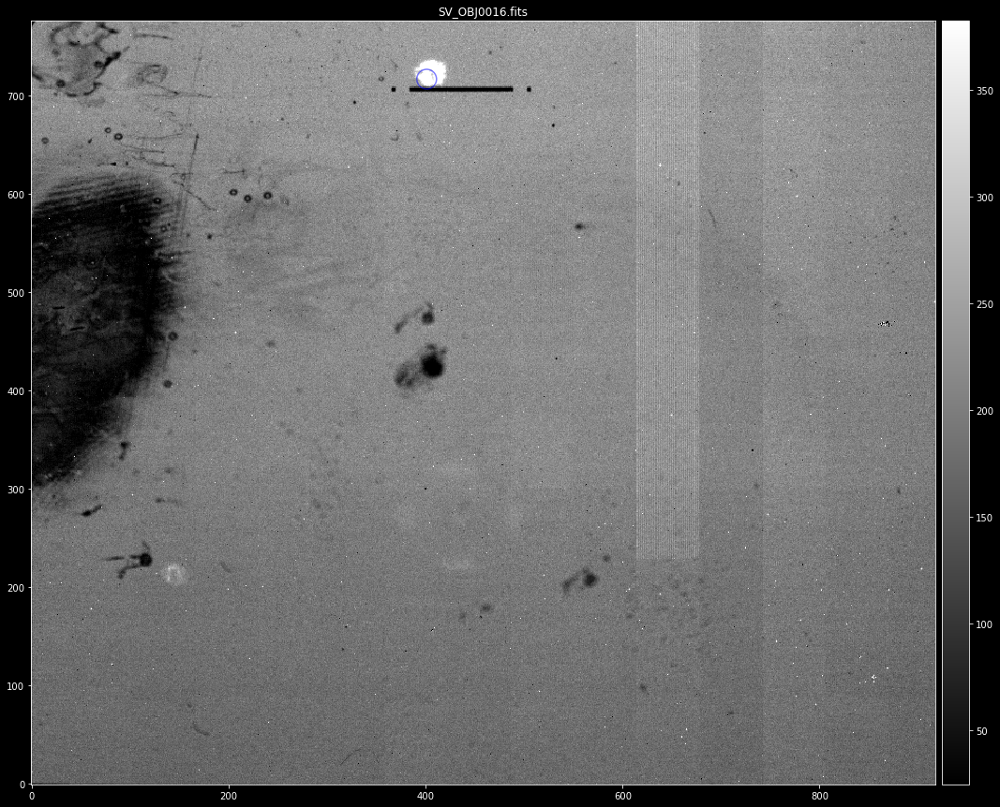

In [233]:
class TripleSpecFocus(object):
    
    def __init__(self):
        self.fig = None
        self.valid_sources = None
        
    def __call__(self, 
                 data_path, 
                 source_fwhm=10.0,
                 det_threshold=5.0, 
                 mask_threshold=2,
                 trim_section='[23:940,115:890]',
                 brightest=3,
                 show_mask=False):
        self.source_fwhm = source_fwhm
        self.det_threshold = det_threshold
        self.mask_threshold = mask_threshold
        self.trim_section = trim_section
        self.brightest = brightest
        self.show_mask = show_mask
        self.valid_sources = []
        
        file_list = sorted(glob.glob(os.path.join(data_path, '*.fits')))
        
        self.fig, self.axes = plt.subplots(len(file_list), 3, figsize=(20, 5 * len(file_list)))
        
        for self.i in range(len(file_list)):
            print("Processing file: {}".format(file_list[self.i]))
            ccd = CCDData.read(file_list[self.i], unit='adu')
            #     print(ccd.data.shape)
            sources = self.detect_sources(ccd)
            if sources is not None:
                self.valid_sources.append(sources)
                
        pd_sources = self._sources_to_pandas()
        print(pd_sources)
                
    def _sources_to_pandas(self):
        all_pandas_sources = []
        for source in self.valid_sources:
            pd_source = source.to_pandas()
            all_pandas_sources.append(pd_source)
        pd_sources = pd.concat(all_pandas_sources)
            
        return pd_sources
        
    def detect_sources(self, ccd):
        ccd = trim_image(ccd, fits_section=self.trim_section)
        #     print(ccd.data.shape)
        ccd.write(os.path.join(data_path, 'trimmed', ccd.header['FILENAME']), overwrite=True)
        #     show_files(ccd)
        mean, median, std = sigma_clipped_stats(ccd.data, sigma=3.0)
        print(mean, median, std)

        ccd.mask = ccd.data <= (median - self.mask_threshold * std)
        #     ccd.mask = ccdmask(ccd, byblocks=True)
        #     ccd.mask = np.ma.masked_all(ccd.data)
        #     ccd.mask[0:170, 263:679] = 1
    
        color_map = copy.copy(cm.gray)
        color_map.set_bad(color='red')
        
        scale = ZScaleInterval()
            
        if self.show_mask:
            fig, ax = plt.subplots(figsize=(20, 15))
            ax.set_title('Bad Pixel Mask\nValues {} Std below median are masked'.format(self.mask_threshold))
            ax.imshow(ccd.mask, cmap=color_map, origin='lower', interpolation='nearest')
    
        daofind = DAOStarFinder(fwhm=self.source_fwhm, 
                                threshold= median + self.det_threshold * std, 
                                exclude_border=True,
                                brightest=self.brightest)
        sources = daofind(ccd.data - median, mask=ccd.mask)
    
        if sources is not None:
            sources.add_column([ccd.header['TELFOCUS']], name='focus')
            sources.add_column([ccd.header['FILENAME']], name='filename')
            for col in sources.colnames:
                if col != 'filename':
                    sources[col].info.format = '%.8g'
            #         print(sources)
            sources.pprint_all()
    
            positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
            print(positions)
        
            
            x = positions[0][0]
            y = positions[0][1]
            x_low = int(x - 3 * self.source_fwhm)
            x_high = int(x + 3 * self.source_fwhm)
            y_low = int(y - 3 * self.source_fwhm)
            y_high = int(y + 3 * self.source_fwhm)
            self.axes[self.i][0].set_title(ccd.header['FILENAME'])
            self.axes[self.i][0].plot(range(x_low, x_high), ccd.data[int(y), x_low:x_high])
            self.axes[self.i][1].plot(range(y_low, y_high),ccd.data[y_low:y_high, int(x)])
            z1, z2 = scale.get_limits(ccd.data[y_low:y_high,x_low:x_high])
            self.axes[self.i][2].imshow(ccd.data, clim=(z1, z2), origin='lower',interpolation='nearest')
            self.axes[self.i][2].set_xlim(x_low, x_high)
            self.axes[self.i][2].set_ylim(y_low, y_high)
            
            z1, z2 = scale.get_limits(ccd.data)
            apertures = CircularAperture(positions, r=self.source_fwhm)
            fig, ax = plt.subplots(figsize=(20,15))
            ax.set_title(ccd.header['FILENAME'])
            
            if self.show_mask:
                masked_data = np.ma.masked_where(ccd.data <= (median - self.mask_threshold * std), ccd.data)
                im = ax.imshow(masked_data, cmap=color_map, origin='lower', clim=(z1, z2),
                               interpolation='nearest')
            else:
                im = ax.imshow(ccd.data, cmap=color_map, origin='lower', clim=(z1, z2),
                               interpolation='nearest')
            apertures.plot(color='blue', lw=1.5, alpha=0.5)
        
            divider = make_axes_locatable(ax)

            cax = divider.append_axes('right', size="3%", pad=0.1)
            plt.colorbar(im, cax=cax)
        else:
            print("Unable to detect sources in file: {}".format(ccd.header['FILENAME']))
        
        return sources


focus = TripleSpecFocus()
focus(data_path=data_path, brightest=1)

In [195]:


if len(all_sources) > 0:
    pd_sources = convert_tables_to_pandas(all_sources=all_sources)
    print(pd_sources)



   id   xcentroid   ycentroid  sharpness  roundness1  roundness2  npix  sky  \
0   1  403.667671  721.621112   0.519348    0.799708    0.561641    81  0.0   
0   1  406.110165  720.737004   0.446242   -0.343090   -0.179116    81  0.0   
0   1  406.896046  720.897883   0.601844    0.300085    0.115166    81  0.0   
0   1  405.657950  723.229138   0.538445    0.464920    0.167114    81  0.0   
0   1  403.199697  726.821992   0.464075    0.826868    0.168172    81  0.0   
0   1  400.938843  714.749539   0.642558    0.215853    0.112286    81  0.0   

      peak       flux       mag   focus         filename  
0   2540.0  14.092101 -2.872439 -1070.0  SV_OBJ0011.fits  
0   7950.0  65.100076 -4.533954  -960.0  SV_OBJ0012.fits  
0  10140.0  71.823099 -4.640660  -850.0  SV_OBJ0013.fits  
0   2893.0  14.750347 -2.922006  -740.0  SV_OBJ0014.fits  
0   1336.0   7.968766 -2.253478  -630.0  SV_OBJ0015.fits  
0    613.0   2.338619 -0.922399  -520.0  SV_OBJ0016.fits  


In [198]:
pd_sources

,id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag,focus,filename
0,1,403.667671,721.621112,0.519348,0.799708,0.561641,81,0.0,2540.0,14.092101,-2.872439,-1070.0,SV_OBJ0011.fits
0,1,406.110165,720.737004,0.446242,-0.343090,-0.179116,81,0.0,7950.0,65.100076,-4.533954,-960.0,SV_OBJ0012.fits
0,1,406.896046,720.897883,0.601844,0.300085,0.115166,81,0.0,10140.0,71.823099,-4.640660,-850.0,SV_OBJ0013.fits
0,1,405.657950,723.229138,0.538445,0.464920,0.167114,81,0.0,2893.0,14.750347,-2.922006,-740.0,SV_OBJ0014.fits
0,1,403.199697,726.821992,0.464075,0.826868,0.168172,81,0.0,1336.0,7.968766,-2.253478,-630.0,SV_OBJ0015.fits
0,1,400.938843,714.749539,0.642558,0.215853,0.112286,81,0.0,613.0,2.338619,-0.922399,-520.0,SV_OBJ0016.fits


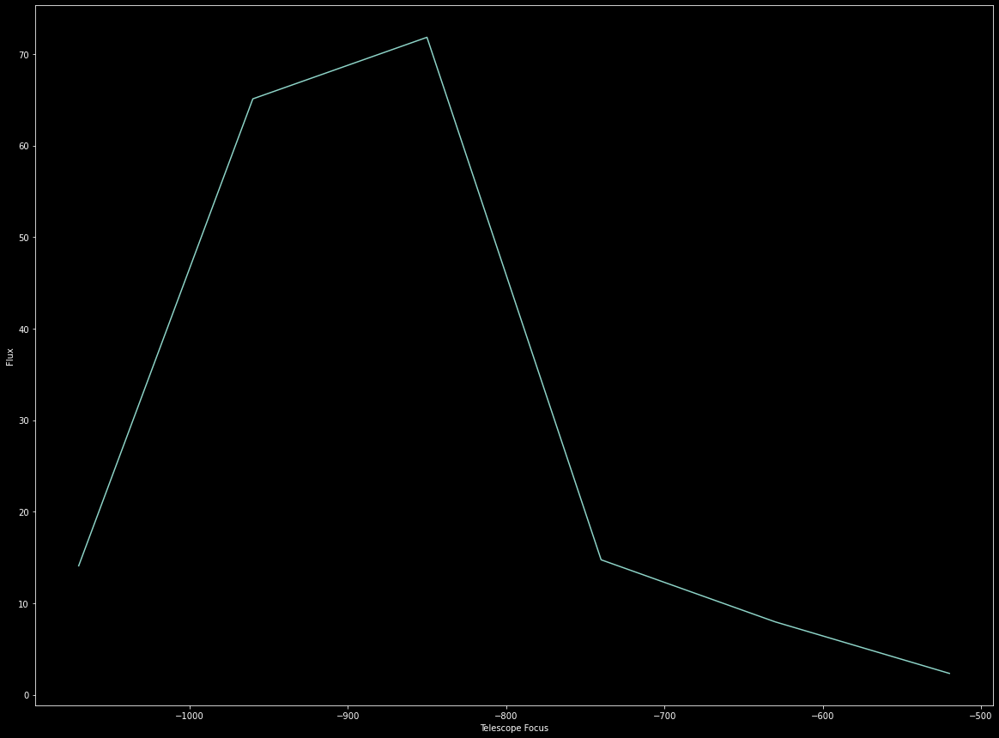

In [201]:

fig, ax = plt.subplots(figsize=(20, 15))
ax.set_xlabel('Telescope Focus')
ax.set_ylabel('Flux')
ax.plot(pd_sources['focus'], pd_sources['flux'])


In [202]:
ccd.header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                  940 / length of data axis 1                          
NAXIS2  =                  940 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
BZERO   =                32768 / offset data range to that of unsigned short    
BSCALE  =                    1 / default scaling factor                         
NEXTEND =                    0 / Number of extensions                           
OBJECT  = 'Focus   '           / object title                                   
PROPID  = '        '        